In [1]:
# Imports

import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from skimage.util import random_noise

# Q1.1

In [2]:
# Define the edge filter

laplacian = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
delta = np.array([[0, 0, 0], [0, 1, 0], [0, 0, 0]])

edge_filter = lambda a: delta - a * laplacian

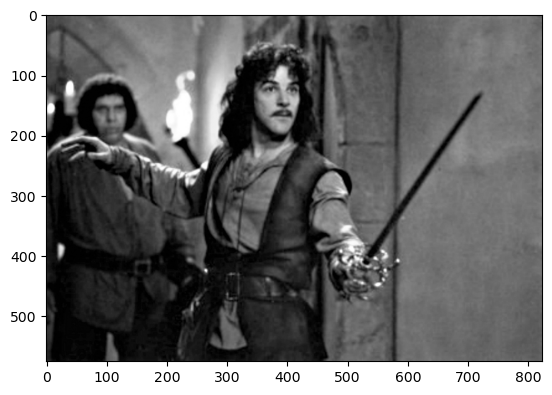

In [3]:
# Load image

img_path = './python2_2025A/Inigo.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

plt.imshow(img, cmap='gray')
plt.show()

In [4]:
# Apply the edge filter

def apply_filter(img, edge_filter):
    img = convolve2d(img, edge_filter, mode='same')
    img = np.clip(img, 0, 255)
    return img

In [5]:
def apply_a_values(img, edge_filter_fn, a_values):
    for a in a_values:
        img_filtered = apply_filter(img, edge_filter_fn(a))
        # Print the original image and the filtered image
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title('Original')
        plt.subplot(1, 2, 2)
        plt.imshow(img_filtered, cmap='gray')
        plt.axis('off')
        plt.title(f'Filtered with a={a:.2f}')
        plt.show()

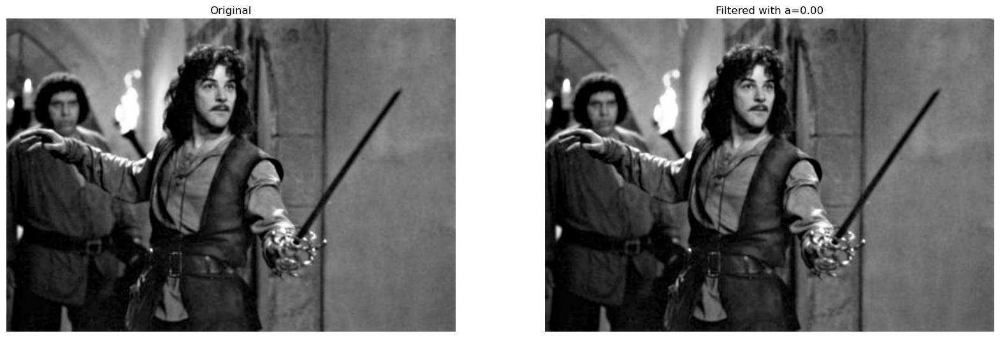

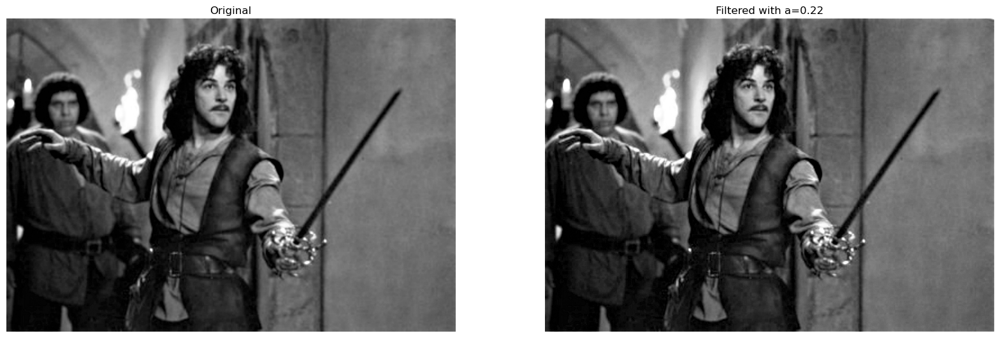

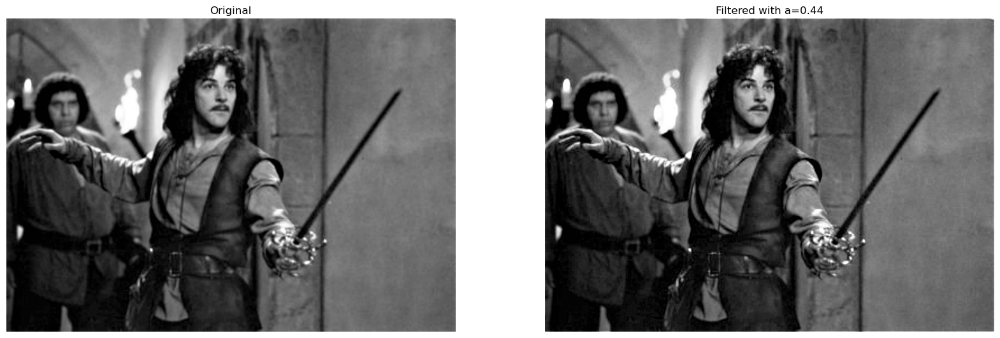

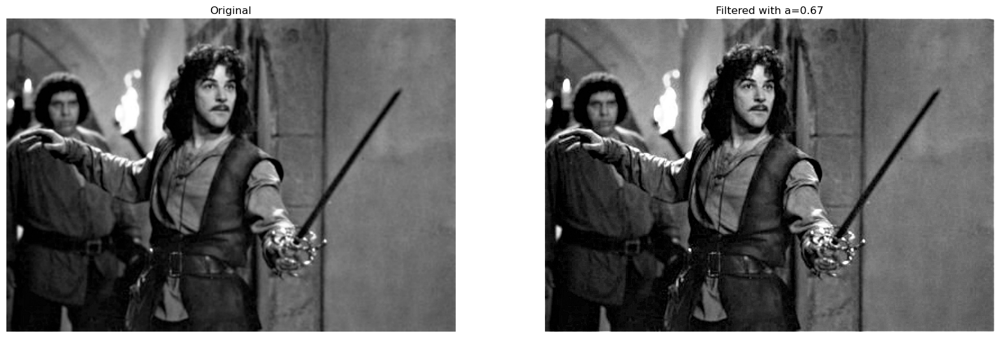

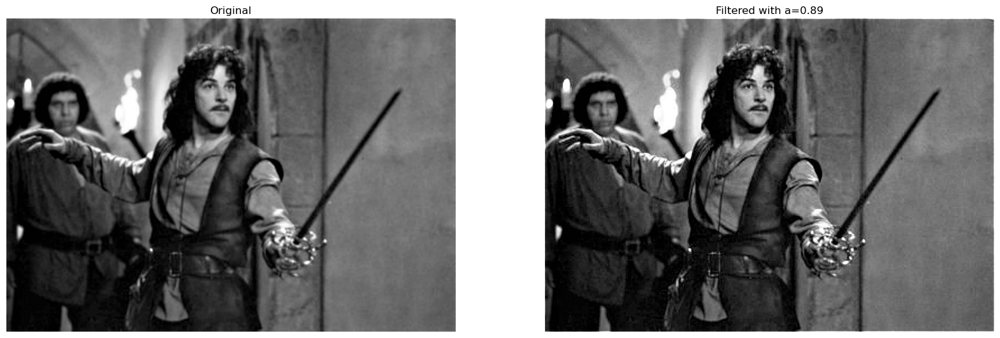

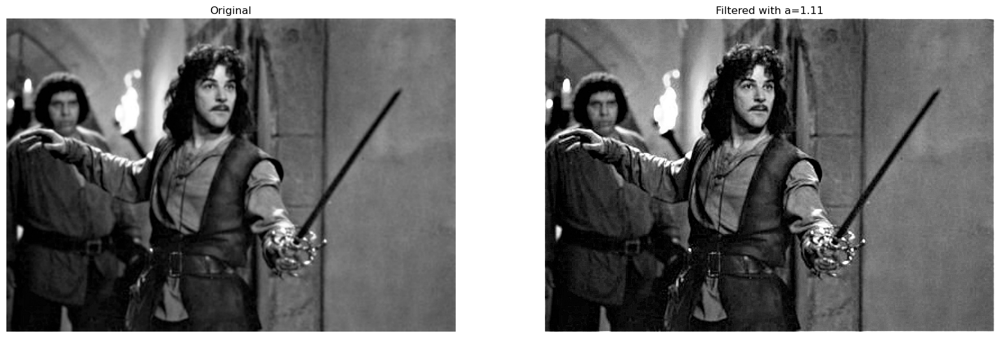

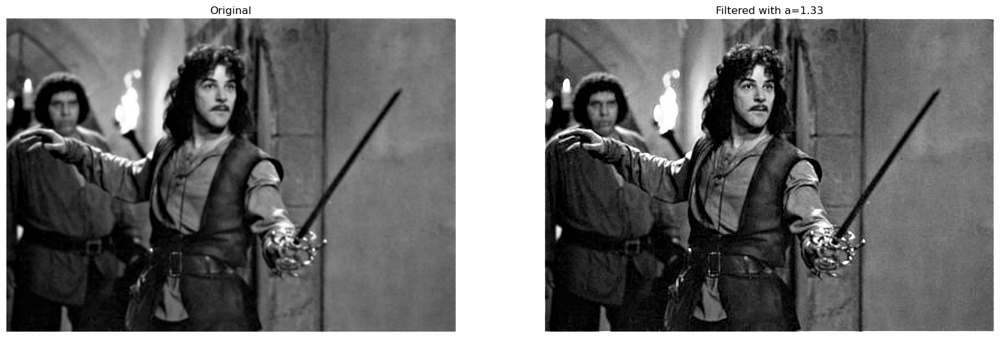

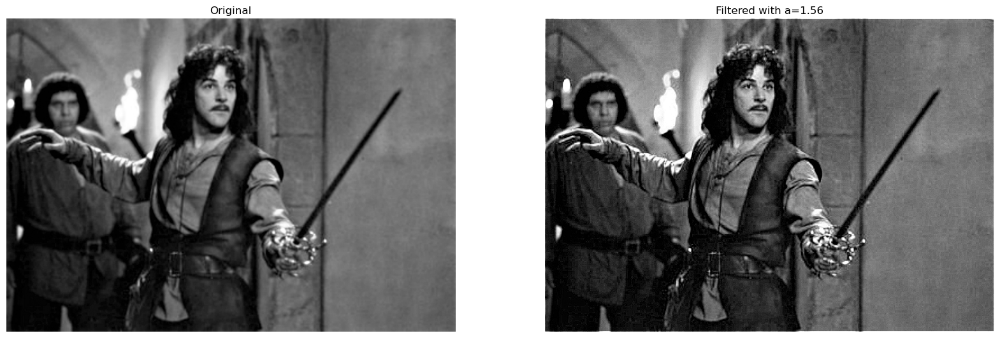

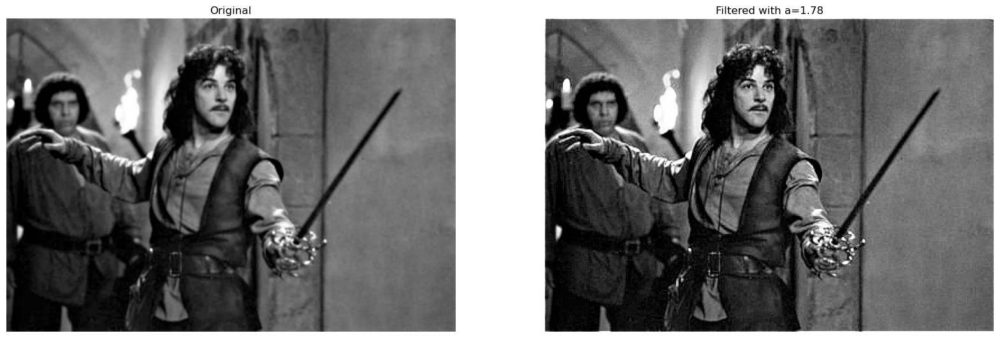

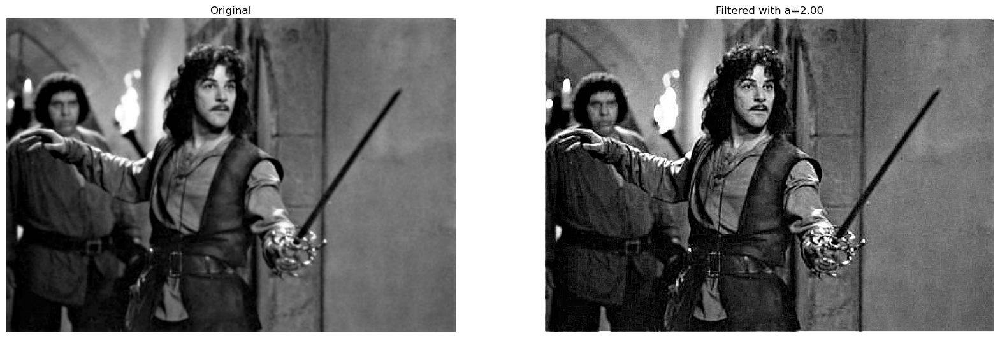

In [6]:
apply_a_values(img, edge_filter, np.linspace(0, 2, 10))

# Q1.2

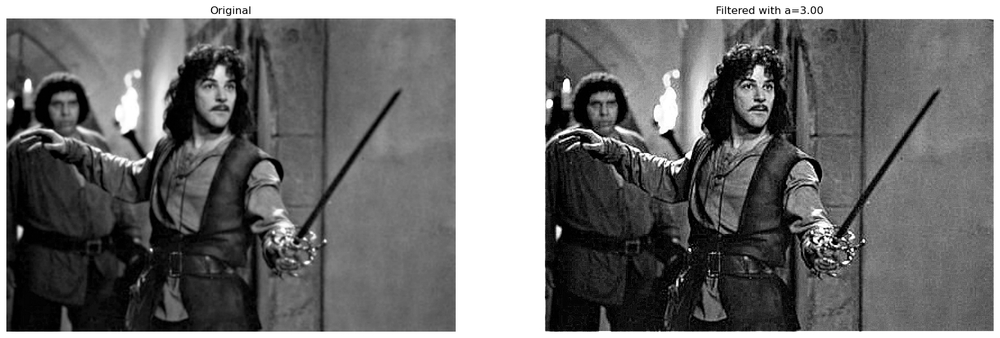

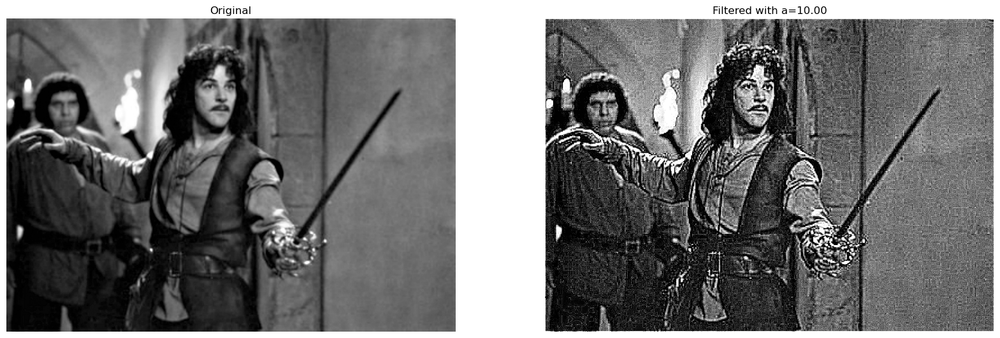

In [7]:
apply_a_values(img, edge_filter, [3.00, 10.00])

# Q1.3

In [8]:
def add_salt_and_pepper_noise(img, amount=0.04):
    noisy_img = img.copy()
    num_salt = np.ceil(amount * img.size * 0.5)
    noisy_img.flat[np.random.randint(0, img.size, int(num_salt))] = 255
    num_pepper = np.ceil(amount * img.size * 0.5)
    noisy_img.flat[np.random.randint(0, img.size, int(num_pepper))] = 0
    return noisy_img

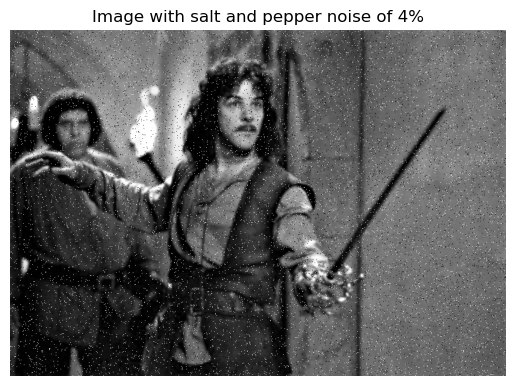

In [9]:
salt_and_pepper_img = add_salt_and_pepper_noise(img)

plt.imshow(salt_and_pepper_img, cmap='gray')
plt.title('Image with salt and pepper noise of 4%')
plt.axis('off')
plt.show()

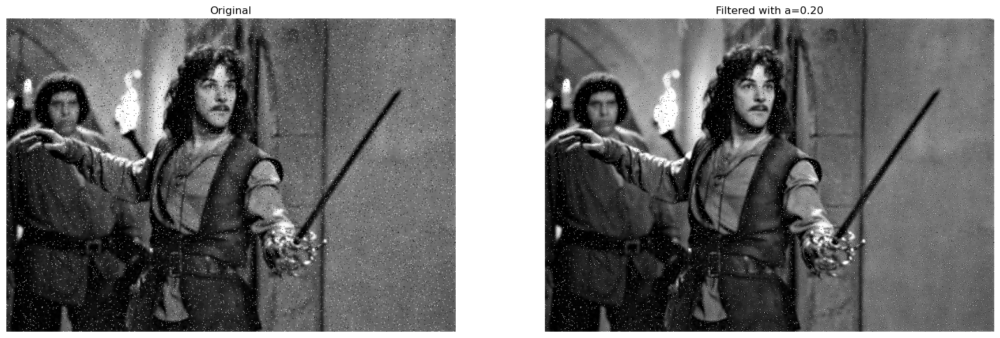

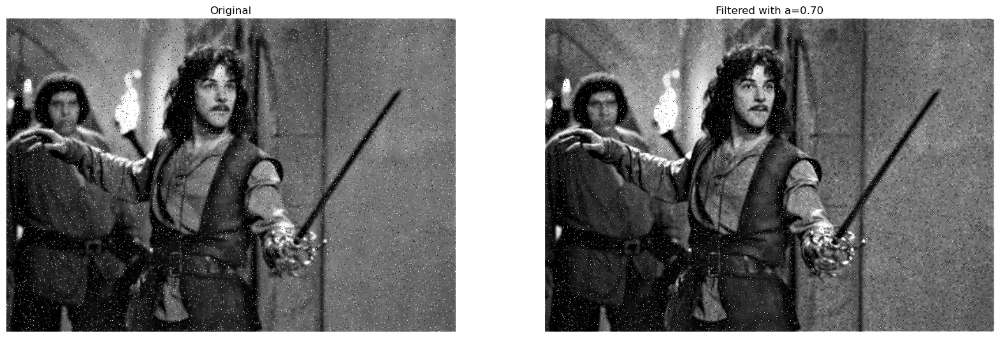

In [10]:
apply_a_values(salt_and_pepper_img, edge_filter, [0.2, 0.7])

# Q1.4

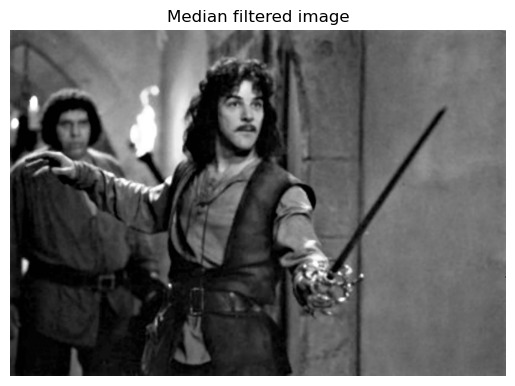

In [11]:
def apply_median_filter(img, kernel_size):
    return cv2.medianBlur(img, kernel_size)

median_filtered_img = apply_median_filter(salt_and_pepper_img, 3)
plt.imshow(median_filtered_img, cmap='gray')
plt.title('Median filtered image')
plt.axis('off')
plt.show()

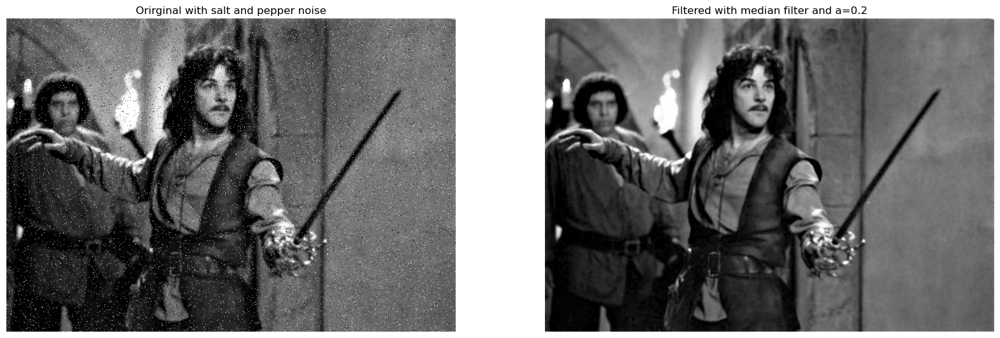

In [12]:
img_filtered = apply_filter(median_filtered_img, edge_filter(0.2))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(salt_and_pepper_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with salt and pepper noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with median filter and a={0.2}')
plt.show()

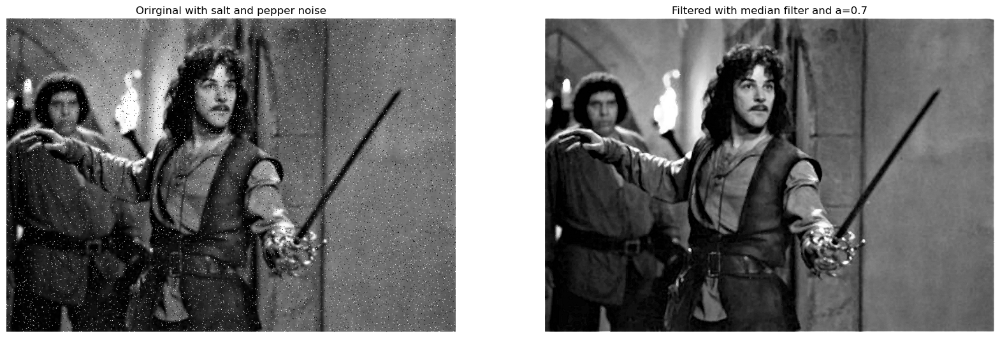

In [13]:
img_filtered = apply_filter(median_filtered_img, edge_filter(0.7))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(salt_and_pepper_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with salt and pepper noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with median filter and a={0.7}')
plt.show()

# Q1.5

In [14]:
def add_shot_noise(img):
    noisy_img = random_noise(img, mode='poisson', clip=True) * 255
    return noisy_img.astype(np.uint8)

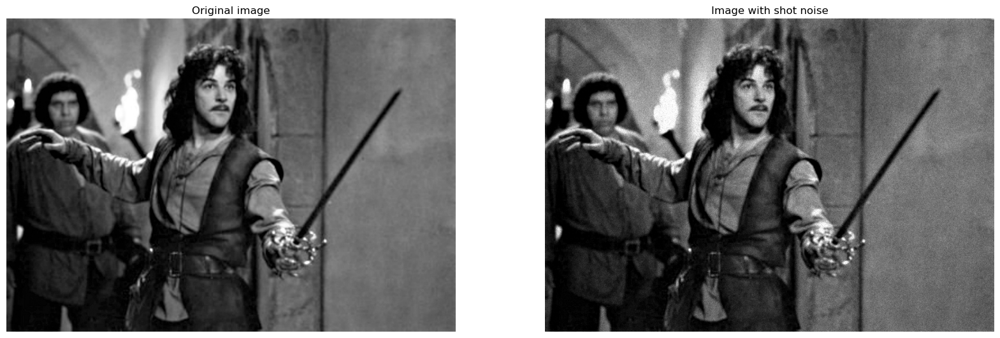

In [15]:
shot_noise_img = add_shot_noise(img)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(shot_noise_img, cmap='gray')
plt.title('Image with shot noise')
plt.axis('off')
plt.show()


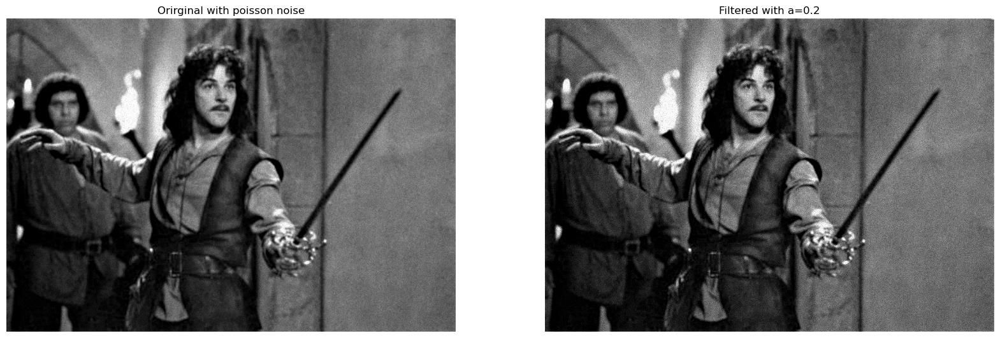

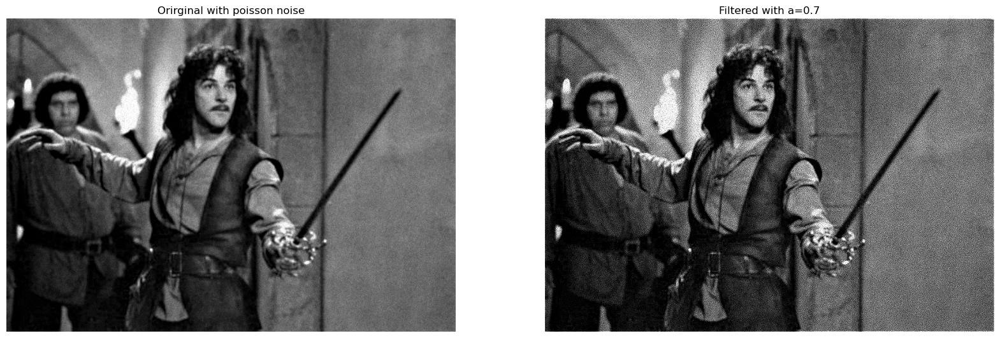

In [16]:
img_filtered = apply_filter(shot_noise_img, edge_filter(0.2))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(shot_noise_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with poisson noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with a={0.2}')
plt.show()

img_filtered = apply_filter(shot_noise_img, edge_filter(0.7))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(shot_noise_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with poisson noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with a={0.7}')
plt.show()

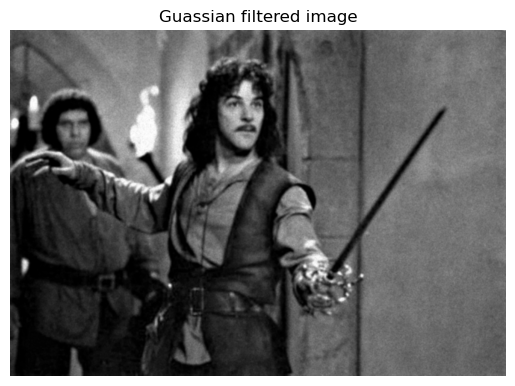

In [17]:
def apply_gaussian_filter(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

gaussin_filtered_img = apply_gaussian_filter(shot_noise_img, 3)
plt.imshow(gaussin_filtered_img, cmap='gray')
plt.title('Guassian filtered image')
plt.axis('off')
plt.show()

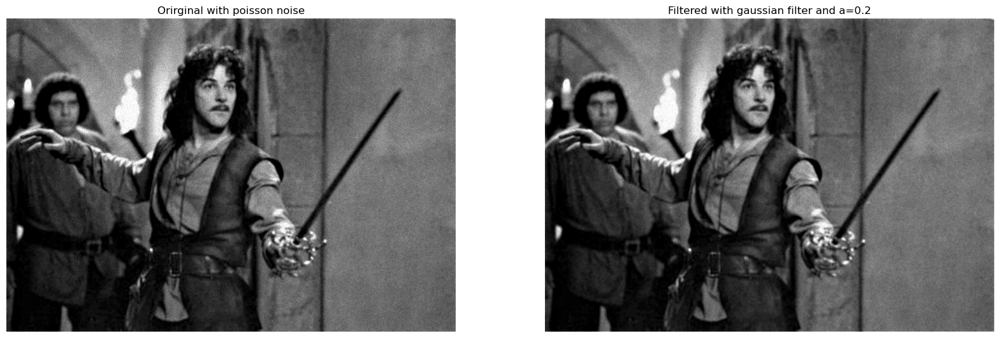

In [18]:
img_filtered = apply_filter(gaussin_filtered_img, edge_filter(0.2))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(shot_noise_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with poisson noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with gaussian filter and a={0.2}')
plt.show()

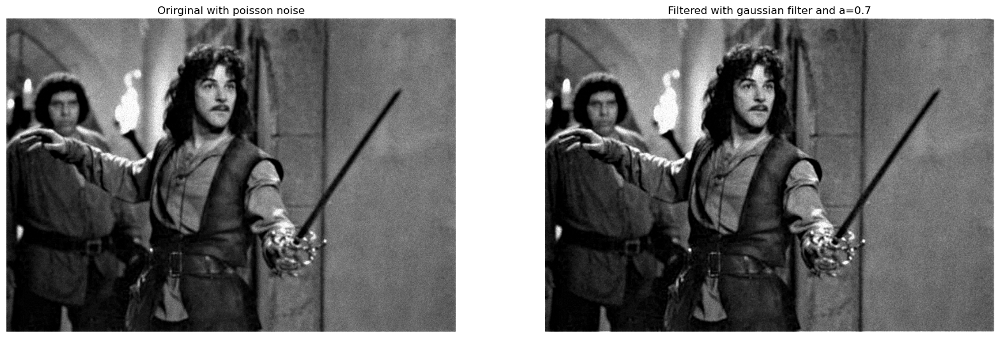

In [19]:
img_filtered = apply_filter(gaussin_filtered_img, edge_filter(0.7))
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(shot_noise_img, cmap='gray')
plt.axis('off')
plt.title('Orirginal with poisson noise')
plt.subplot(1, 2, 2)
plt.imshow(img_filtered, cmap='gray')
plt.axis('off')
plt.title(f'Filtered with gaussian filter and a={0.7}')
plt.show()